# What are the outliers

Notebook dedicated to running tests and figure out what causes those outliers on the second trajectory.

Questions addressed in this notebook:
- [Is it related to s_star crossings?](#sstar)
- [Is it related to residuals?](#residuals)
- [Explore n, k & r of dynamic stress](#nr)

Last updated: 26 June 2020

## Imports

In [1]:
# import packages and set working directory
import numpy as np
import matplotlib.pyplot as plt
import os
from math import exp
import pandas as pd
import seaborn as sns
import proplot as plot
import sys
from scipy.stats import t
from scipy.optimize import curve_fit
import time
import progressbar

# We need to add the module path to our system path so 
# that our notebook can find our local objects and code:
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)
    
# import objects
from farm import Climate
from farm import Soil
from farm import Crop
from farm import CropModel
from farm.functions import *

# set background color
plot.rc['figure.facecolor'] = 'white'
plot.rc.axesfacecolor = 'white'
plot.rc['savefig.transparent'] = 'False'

## Functions

In [2]:
def dyn_stress(n_sim = 1000, station = 'OL JOGI FARM', texture = 'clay loam', lgp=180, pd_sim=60): 
    """ Run simulations for a specific climate, soil, and crop.

    Usage: total_rf_corr(n_sim, pd_ic, station, texture, lgp, pd_sim)
           
    Default values:
        n_sim = 1000 # Number of Simulations to Remove Initial Conditions [integer]
        pd_ic = 1 # Planting Date for Initial Conditions [Julian day]
        station = 'OL JOGI FARM' # Climatology [string]
        texture = 'clay' # Soil Type [string]
        lgp = 180 # Length of Growing Period [Days]
        pd_sim 100 # Planting Date for Simulation [Julian day]

    """
    # Part 1. Set conditions for IC runs
    n_sim = n_sim # change back to 1000 later
    planting_date = pd_sim 

    # Part 2. Initialize model with a climate, soil and crop
    climate = Climate(station=station)
    soil = Soil(texture=texture)
    crop = Crop(soil=soil, lgp=lgp)
    soil.set_nZr(crop)

    model = CropModel(crop=crop, climate=climate, soil=soil)
    model.run()
    o = model.output()

    # Part 3. Get the mean, SD soil moisture and run the simulations to remove IC
    s0_mean, s0_std = average_soil_moisture(model, n_sims=n_sim, doy=planting_date)
    models = [CropModel(crop=crop, climate=Climate(), soil=soil) for i in np.arange(n_sim)]
    
    # Part 4. Run the actual simulations
    output = [model.run(s0=s0_mean, do_output=True, planting_date=planting_date) for model in models]

    # Part 5. Subset the growing period and get avg stress, total rf
    start = 21 
    end = start + lgp
    avg_stress = [df[start:end]['stress'].mean() for df in output]
    total_stress = [df[start:end]['stress'].sum() for df in output]

    # dont need this but helpful for debugging
    total_rf = [df[start:end]['R'].sum() for df in output]
    avg_s = [df[start:end]['s'].mean() for df in output]
    sat = [df[start:end]['s'] for df in output]
    stress = [df[start:end]['stress'] for df in output]
    
    o = output
    
    # Part 6. Output the dynamic stress and yield values
    # prev crop.calc_dstress
    x = [crop.calc_dstress(s=df.s, stress=df.stress) for df in o] #for i in np.arange(n_sim)
    #print(x)
    
    # Part 7. TODO: Define kc, a little janky and needs to be automated
    start = 21
    end = 21 + 180
    kc = o[1][start:end]['kc'].tolist()
    
    return  x, total_rf, sat, stress, o, crop, output, kc, start, end, #output, avg_stress, total_stress, total_rf, mstr_memb, dstr_memb, yield_kg_ha

# Note: Not great practice to return all of these variables, but for testing it's useful
data, rf, sat, stress, o, crop, output, kc, start, end = dyn_stress()

In [45]:
# Turn dynamic water stress data into a tuple
df = pd.DataFrame.from_records(data, columns =['AvgStress2','DynamicStress','Yield'])
df['RF'] = rf

# We'll be using these variables a lot
x = df.RF
y = df.Yield

max(df.RF)

806.4202400744093

### Scatter plot of raw data
We want to figure out what's driving that second group 

Text(0.5, 0, 'Rainfall (mm)')

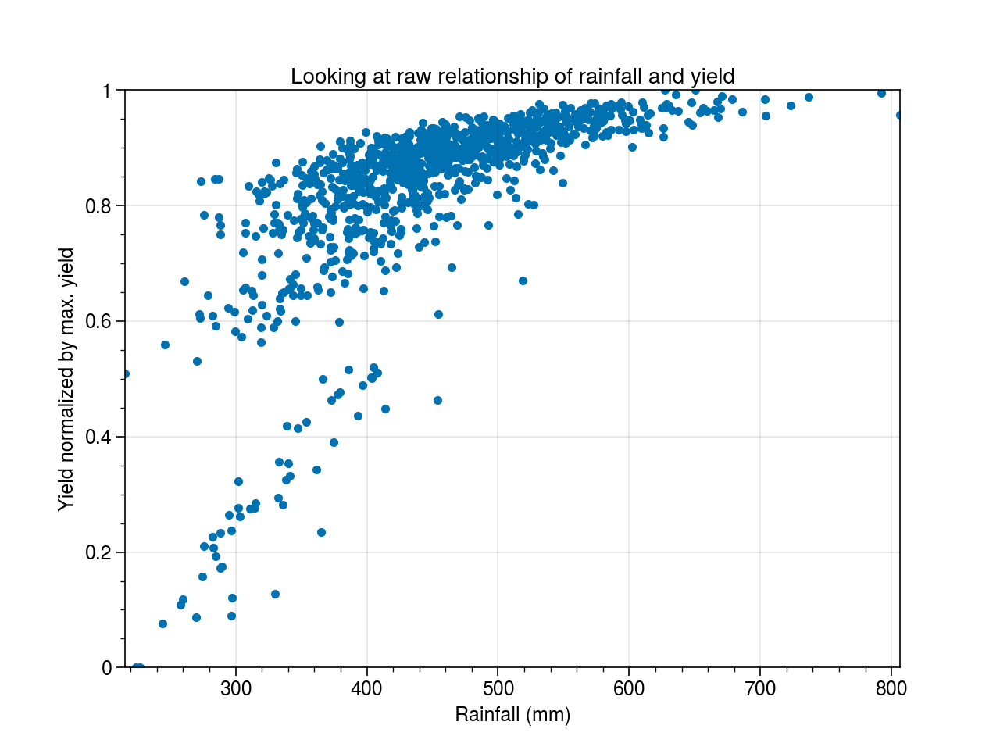

In [46]:
# Scatter plot of raw data
max(df.Yield)

df['Yield_norm'] = df.Yield/max(df.Yield)

plt.scatter(df.RF, df.Yield_norm)
#plt.ylim(-.10,1.10)
#plt.xlim(100,900)
plt.title('Looking at raw relationship of rainfall and yield')
plt.ylabel('Yield normalized by max. yield')
plt.xlabel('Rainfall (mm)')

### Are the second group of simulations related to time series that have values above s star?

In [47]:
# For any simulation, we can see whether there is a value of s greater than or equal to s_star
i = 4
if len(output[i][output[i].s >= crop.s_star]) > 0:
    print('True')

output[i].s

True


0      0.673320
1      0.665012
2      0.657135
3      0.649664
4      0.642574
         ...   
203    0.573801
204    0.570039
205    0.566550
206    0.563308
207    0.560292
Name: s, Length: 208, dtype: float64

In [48]:
# This tells us where in the time series s crosses s star
indx_memb = np.where(output[i].s >= crop.s_star)
indx_memb

# This is a dataframe of those occurrences
output[i][output[i].s >= crop.s_star]

# versus the whole time series
output[i][start:end]

,kc,LAI,stress,R,s,E,ET,T,L,dsdt,dos,doy
21,0.300000,0.750000,0.188193,0.481808,0.671547,1.275968,1.955393,0.679426,0.0,-1.473586,1.0,60
22,0.300000,0.750000,0.210294,0.000000,0.665355,1.229149,1.878855,0.649706,0.0,-1.878855,2.0,61
23,0.300000,0.750000,0.240252,4.527446,0.657461,1.170307,1.782120,0.611813,0.0,2.745326,3.0,62
24,0.300000,0.750000,0.197150,0.000000,0.668996,1.256608,1.923789,0.667181,0.0,-1.923789,4.0,63
25,0.300000,0.750000,0.226908,0.000000,0.660913,1.195917,1.824300,0.628382,0.0,-1.824300,5.0,64
...,...,...,...,...,...,...,...,...,...,...,...,...
196,0.653333,2.300000,0.542217,0.000000,0.595912,0.343775,1.313993,0.970218,0.0,-1.313993,176.0,235
197,0.640000,2.266667,0.575228,0.000000,0.590391,0.333226,1.209292,0.876066,0.0,-1.209292,177.0,236
198,0.626667,2.233333,0.606470,2.740887,0.585310,0.323784,1.114342,0.790557,0.0,1.626545,178.0,237
199,0.613333,2.200000,0.564640,0.000000,0.592144,0.349852,1.224836,0.874984,0.0,-1.224836,179.0,238


## Subset simulations that experienced s_star crossing <a id='sstar'></a>

Color points on whether or not they have a value in the time series that crosses s_star...

We want to select the simulation numbers based on index that experienced s_star crossing

In [49]:
s_min = []
n_sim = 1000
no_sims = np.arange(0,n_sim)

# figure out index number for simulation
for i in no_sims:
    #print(output[i][start:end]['s'].min())
    #_s_min = output[i][start:end]['s'].min()
    #_s_min = output[i][output[i].s >= crop.s_star]
    
    # What this does is if the length of the dataframe is greater than 0 then it prints the 
    # simulation number which means that it has a crossing
    if len(output[i][start:end][output[i].s >= crop.s_star]) > 0:
        s_min.append(i)
    #s_min.append(_s_min)
    
result = pd.DataFrame({'sim_no':s_min}).sim_no.tolist()
good = result

# put all those indices together and change the color of the scatterplot

# How many simulations do cross s star?
len(good)

<ipython-input-49-926a59321557>:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if len(output[i][start:end][output[i].s >= crop.s_star]) > 0:


934

In [50]:
# this is not the smartest way of doing this, but I need two dataframes one with the sims that cross star and the other one that doesnt
#result['flag'] = result.loc[result.index.isin(good)]
#result
df1 = df[df.index.isin(good)]
df2 = df[~df.index.isin(good)]

print(len(df))
print(len(df1))
print(len(df2))

1000
934
66


Text(0.5, 0, 'Rainfall (mm)')

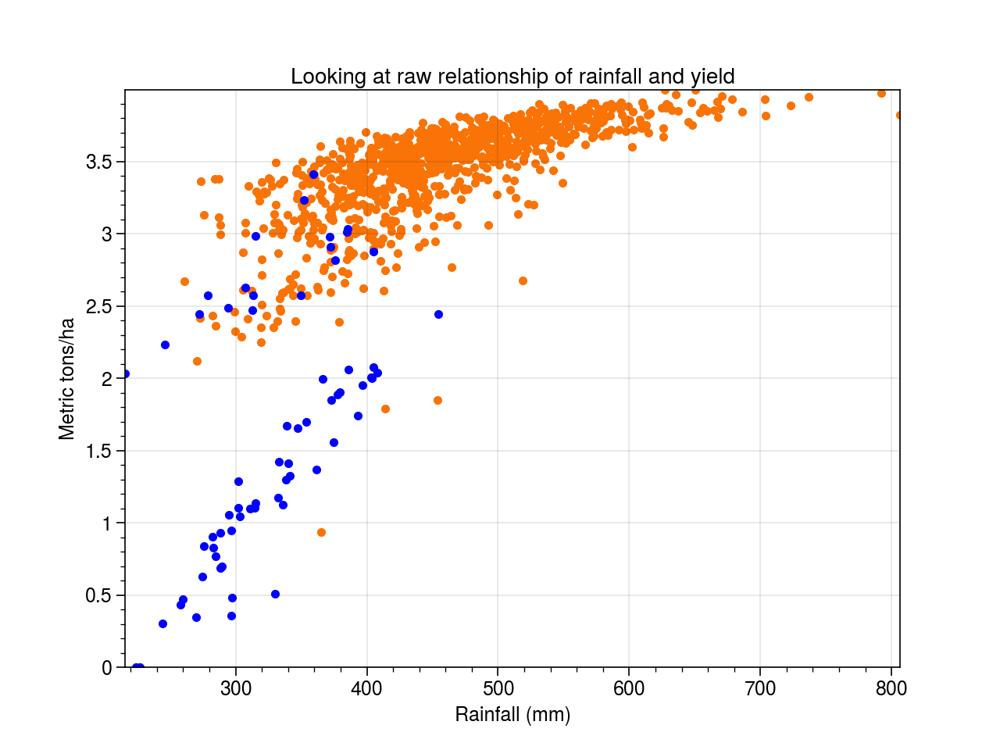

In [51]:
# scatter plot of raw data
max(df.Yield)

#df1['Yield_norm'] = df.Yield/max(df.Yield)
#df1['Yield_norm'] = df1.Yield/max(df1.Yield)

plt.scatter(df1.RF, df1.Yield/1000, color='orange')
plt.scatter(df2.RF, df2.Yield/1000, color='blue')
#plt.ylim(-.10,1.10)
#plt.xlim(100,900)
plt.title('Looking at raw relationship of rainfall and yield')
plt.ylabel('Metric tons/ha')
plt.xlabel('Rainfall (mm)')

- So, conclusion, whether saturation time series goes above s star does not determine whether points into second trajectory.
- However, it could have something to do with whether the crop fails
- Not testing this out yet

## What are the initial values of s and stress when the model starts?

Maybe the crop is not consistently stressed for all of the model runs

count    55.000000
mean      0.635016
std       0.035153
min       0.574275
25%       0.604827
50%       0.637062
75%       0.654769
max       0.734510
Name: 0, dtype: float64
count    945.000000
mean       0.694332
std        0.065373
min        0.563182
25%        0.642726
50%        0.688805
75%        0.743922
max        0.866011
Name: 0, dtype: float64


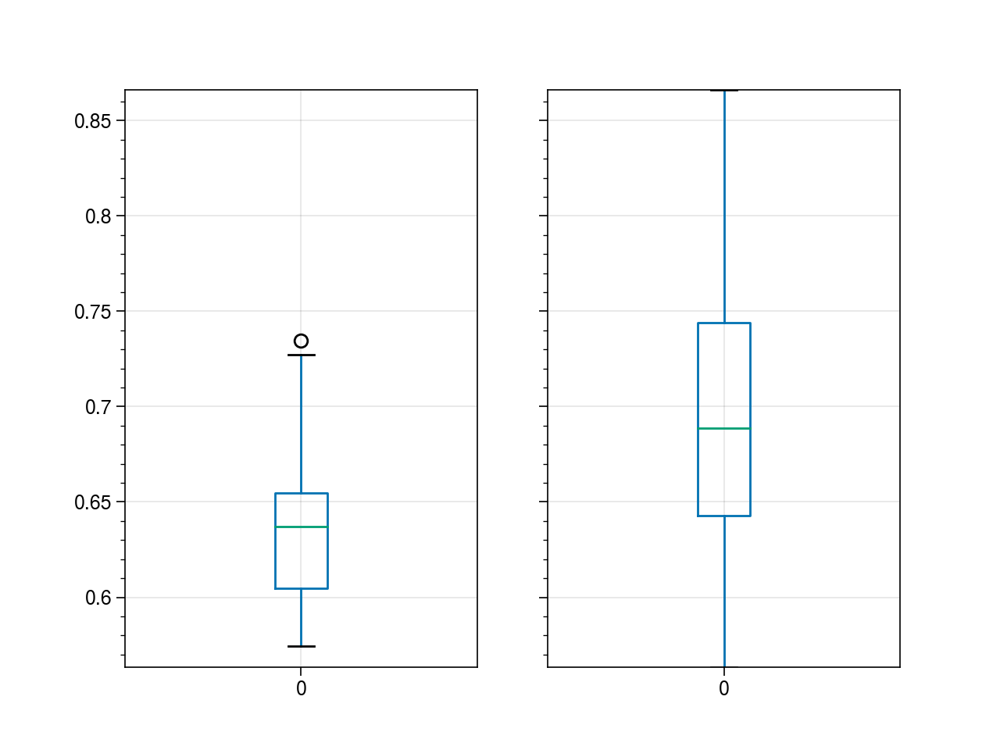

In [70]:
s0 = pd.DataFrame(list(zip(*sat))[0]).reset_index()

# check out some summary statistics
s0[0].describe()

# now subdivide by two categories
df1 = s0[s0.index.isin(good)]
df2 = s0[~s0.index.isin(good)]

# summary stats again
print(df1[0].describe())
print(df2[0].describe())

# not a clear difference here
fig, ax = plt.subplots(nrows=1, ncols=2, sharey=True)
df1[0].plot.box(ax=ax[0]) 
df2[0].plot.box(ax=ax[1]) 

count    55.000000
mean      0.355740
std       0.155146
min       0.033109
25%       0.251008
50%       0.326901
75%       0.490968
max       0.677164
Name: 0, dtype: float64
count    945.000000
mean       0.183819
std        0.182334
min        0.000000
25%        0.020826
50%        0.133063
75%        0.301505
max        0.752158
Name: 0, dtype: float64


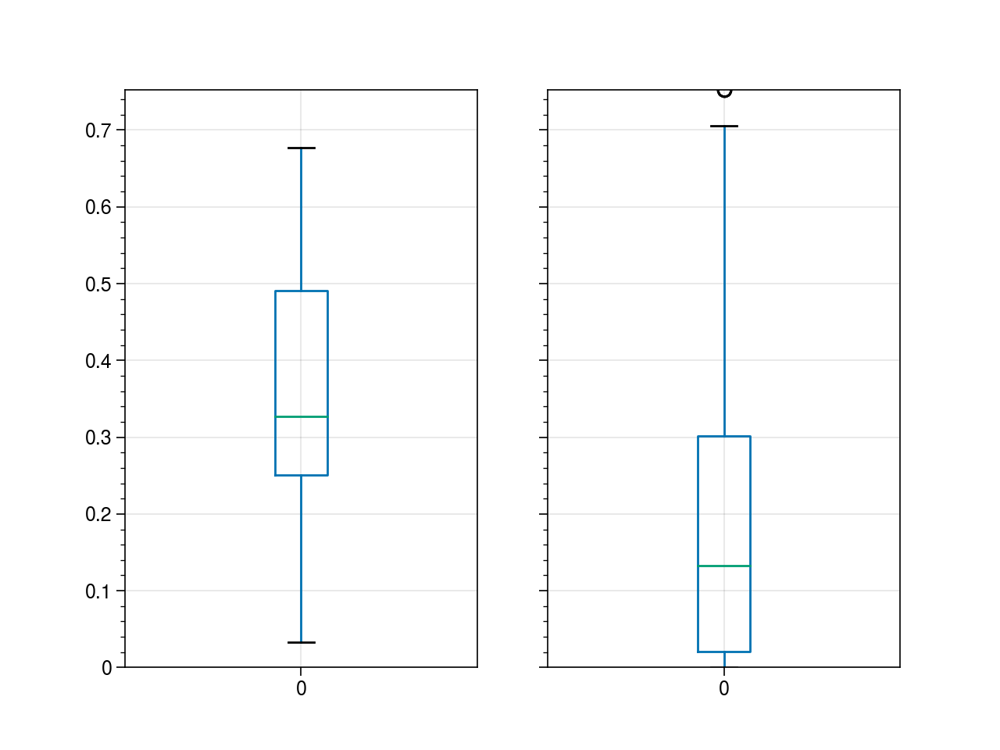

In [79]:
st0 = pd.DataFrame(list(zip(*stress))[0]).reset_index()

# check out some summary statistics
st0[0].describe()

# now subdivide by two categories
df1 = st0[st0.index.isin(good)]
df2 = st0[~st0.index.isin(good)]

# summary stats again
print(df1[0].describe())
print(df2[0].describe())

# not a clear difference here
fig, ax = plt.subplots(nrows=1, ncols=2, sharey=True)
df1[0].plot.box(ax=ax[0]) 
df2[0].plot.box(ax=ax[1]) 

## Go back a step: Define the points on that second trajectory using residuals <a id='residuals'></a>


Defined as errors below `some_num`. For 1000 runs, how many are the outliers?

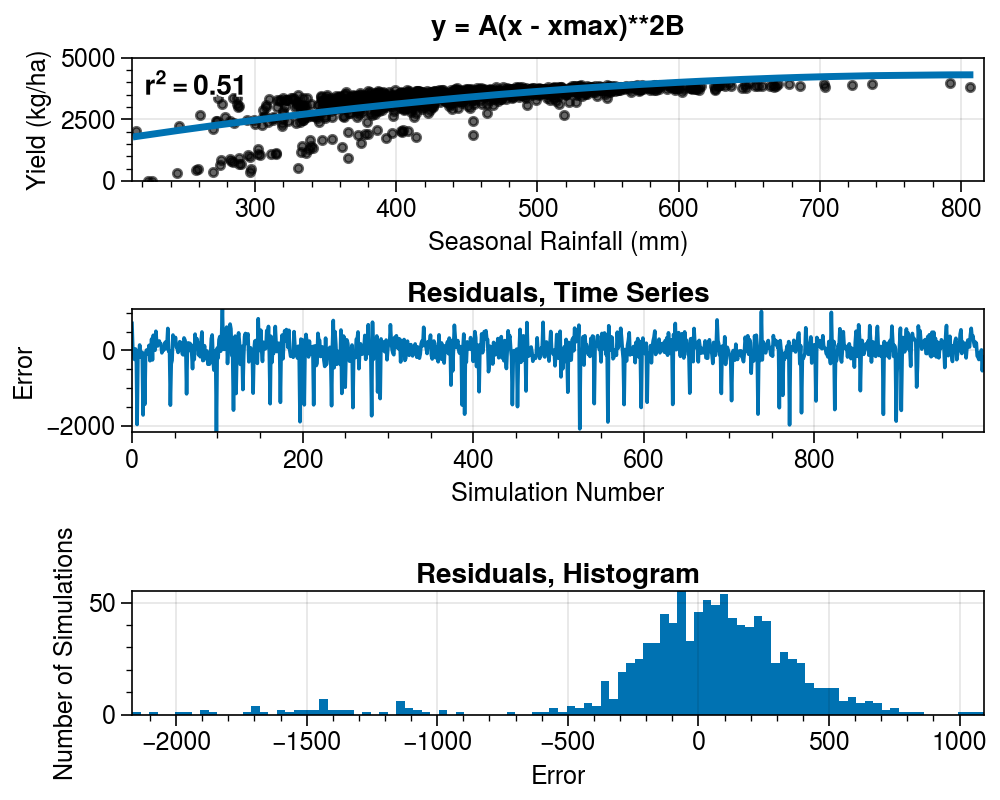

In [54]:
# New fit
residuals = plot_newfit(df.RF, df.Yield, 'Seasonal Rainfall (mm)', 'Yield (kg/ha)')

In [55]:
# Explore errors that are below `some_num` and see if there are commonalities
some_num = -568

residuals[residuals.le(some_num)]

# return rows in pandas dataframe based on index from other column
print(len(df[df.index.isin(residuals[residuals.le(some_num)].index)]))

residuals[residuals.le(some_num)]

55


6     -1963.896112
13    -1711.652195
15    -1427.848442
45    -1451.386970
64    -1151.700009
99    -2169.004539
119   -1583.029212
122   -1142.304926
130   -1037.796863
142   -1132.855402
162   -1413.577524
174   -1376.001799
197   -1891.272289
202   -1443.486797
213   -1442.836553
234   -1466.190895
246   -1139.965603
250    -975.859517
259   -1516.750207
281   -1732.978240
288   -1102.840745
291   -1277.265714
374    -920.022287
387   -1446.352362
390   -1690.261440
407   -1096.291511
446   -1437.696930
452   -1491.046753
462   -1075.444251
503    -701.293348
511   -1108.244139
525   -2079.877055
542   -1411.136896
558   -1898.380579
577   -1436.272134
597   -1512.745811
604   -1374.507283
634   -1432.456508
654   -1132.219954
691   -1140.005414
703   -1331.852803
726    -604.383144
734   -1689.054918
759   -1519.522606
763   -1191.025518
771   -1973.830036
785   -1653.746836
802   -1340.301574
824   -1569.153324
854   -1068.613818
881   -1694.153301
896   -1874.277544
897    -592.

In [56]:
# select these indices
bimod = df[df.index.isin(residuals[residuals.le(some_num)].index)]
bimod.index

Int64Index([  6,  13,  15,  45,  64,  99, 119, 122, 130, 142, 162, 174, 197,
            202, 213, 234, 246, 250, 259, 281, 288, 291, 374, 387, 390, 407,
            446, 452, 462, 503, 511, 525, 542, 558, 577, 597, 604, 634, 654,
            691, 703, 726, 734, 759, 763, 771, 785, 802, 824, 854, 881, 896,
            897, 902, 920],
           dtype='int64')

In [57]:
# print a whole bunch of time series with these values.
# TODO. This is not a pretty or efficient way to do this!
# but it works

# convert list of lists into pandas dataframe
df_sat = pd.DataFrame(sat)
df_stress = pd.DataFrame(stress)

df_sat2 = df_sat.reset_index()
df_sat3 = df_sat2.reset_index()

df_sat3['sim_no'] = df_sat3['level_0'] + 1
df_sat4 = df_sat3.drop(['level_0','index'], axis=1)
df_sat4 # there must be  more efficient way to do this
bimod_sat = df_sat4[df_sat4.sim_no.isin(bimod.index)]
df_sat4[df_sat4.sim_no.isin(bimod.index)] # this is true, ignore index

len(bimod_sat) == len(bimod.index) # True! great!

bimod_sat = bimod_sat.reset_index()

colnames = bimod_sat.sim_no.tolist()

#bimod_sat.plot()
bimod_sat = bimod_sat.T.drop(['sim_no', 'index'],axis=0)
bimod_sat.columns = colnames

# currently index goes from 21 to 180, which is day of simulation, but I want day of year
bimod_sat.index = bimod_sat.index - 20

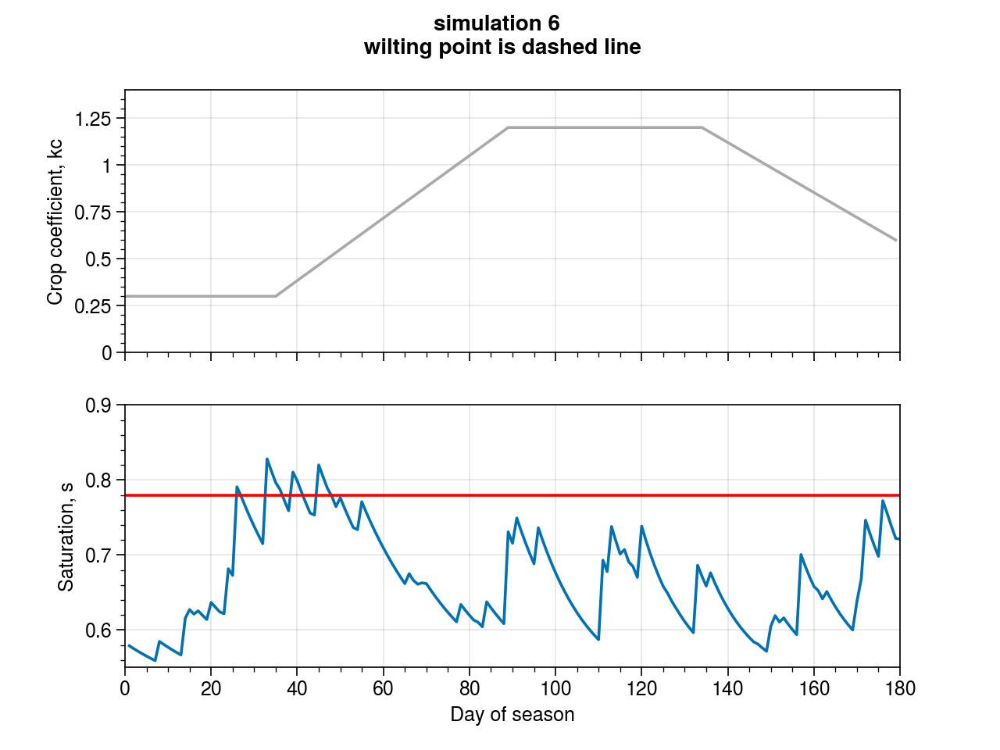

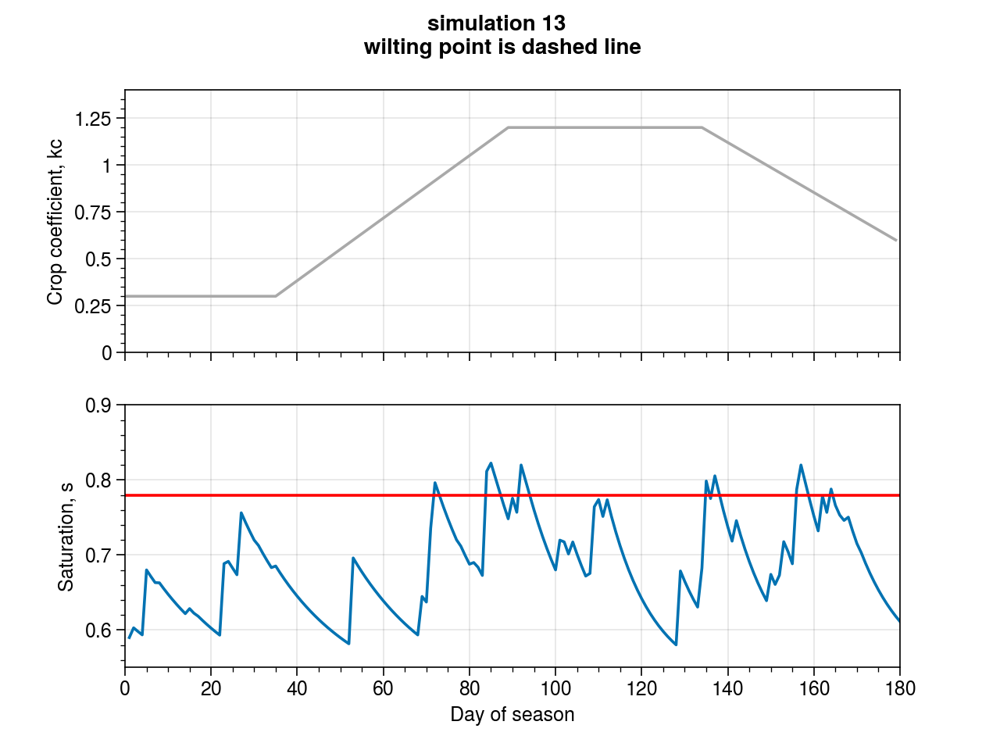

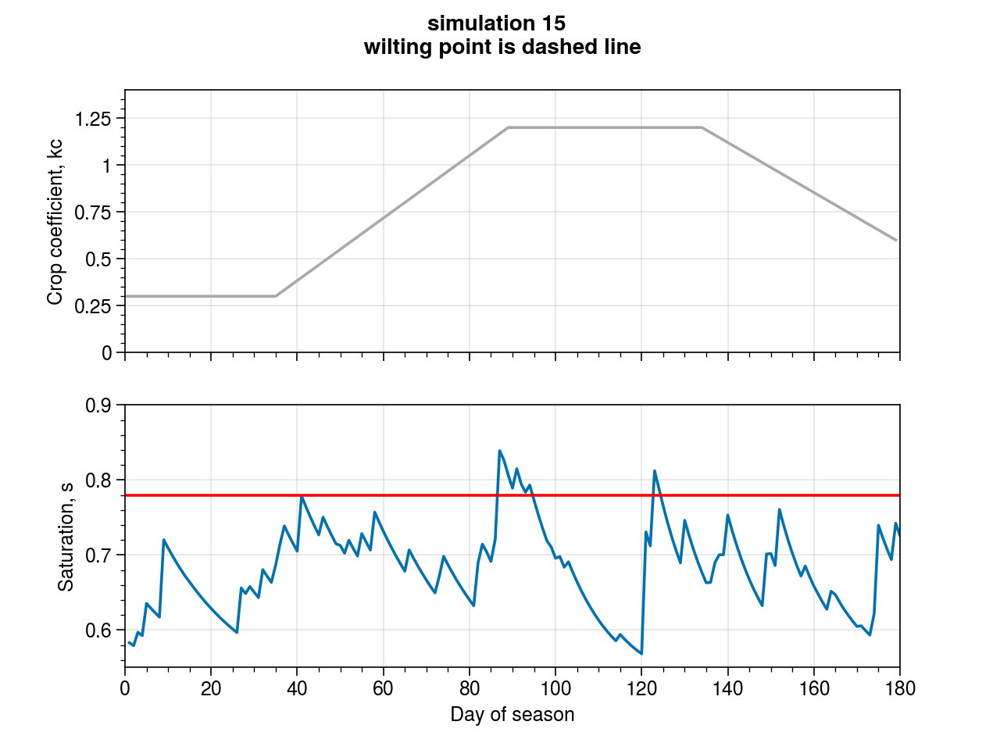

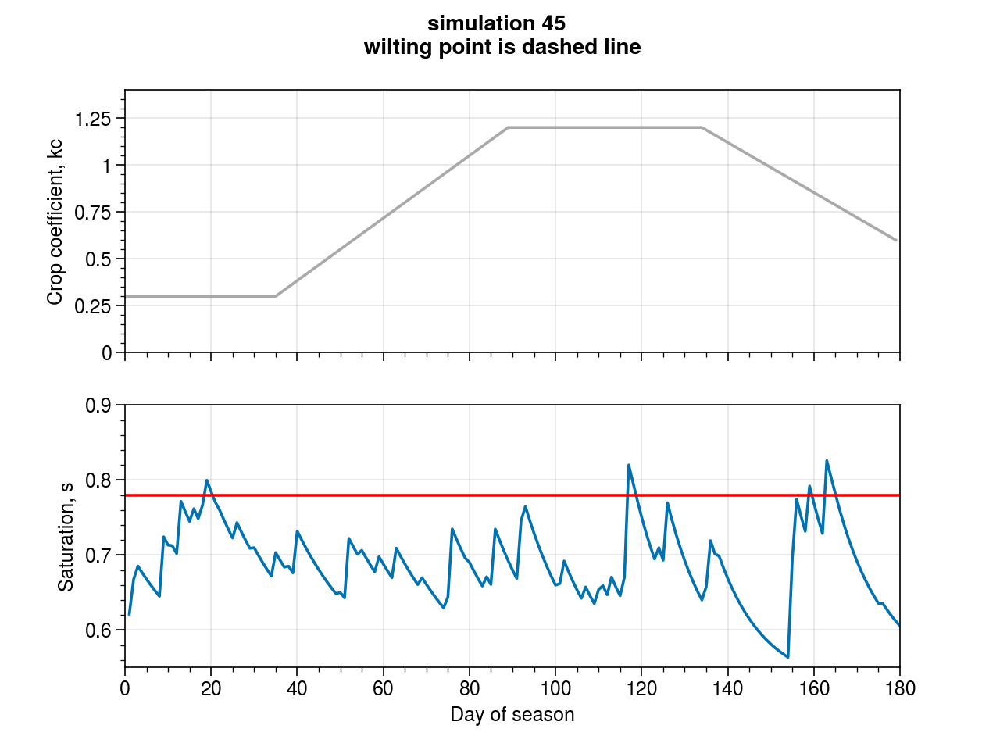

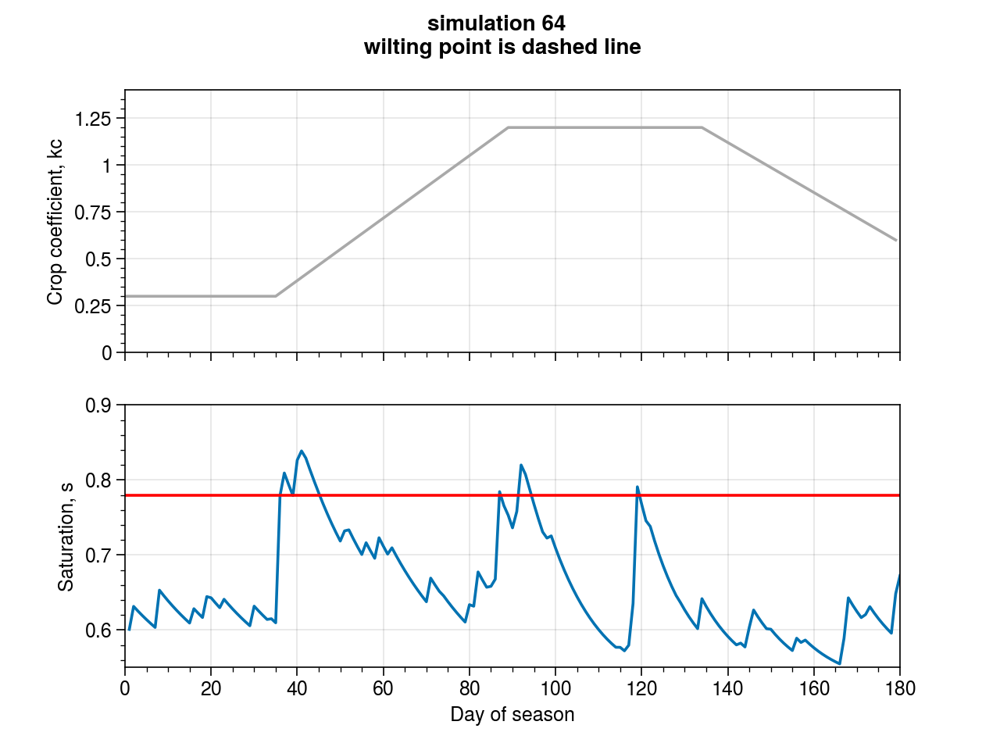

...

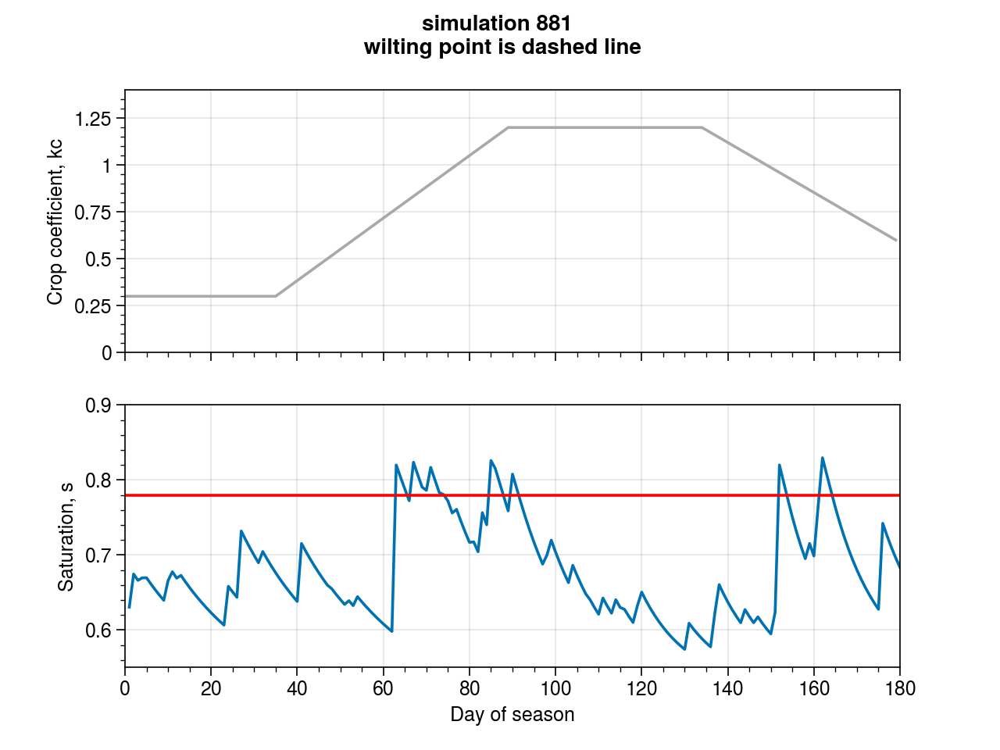

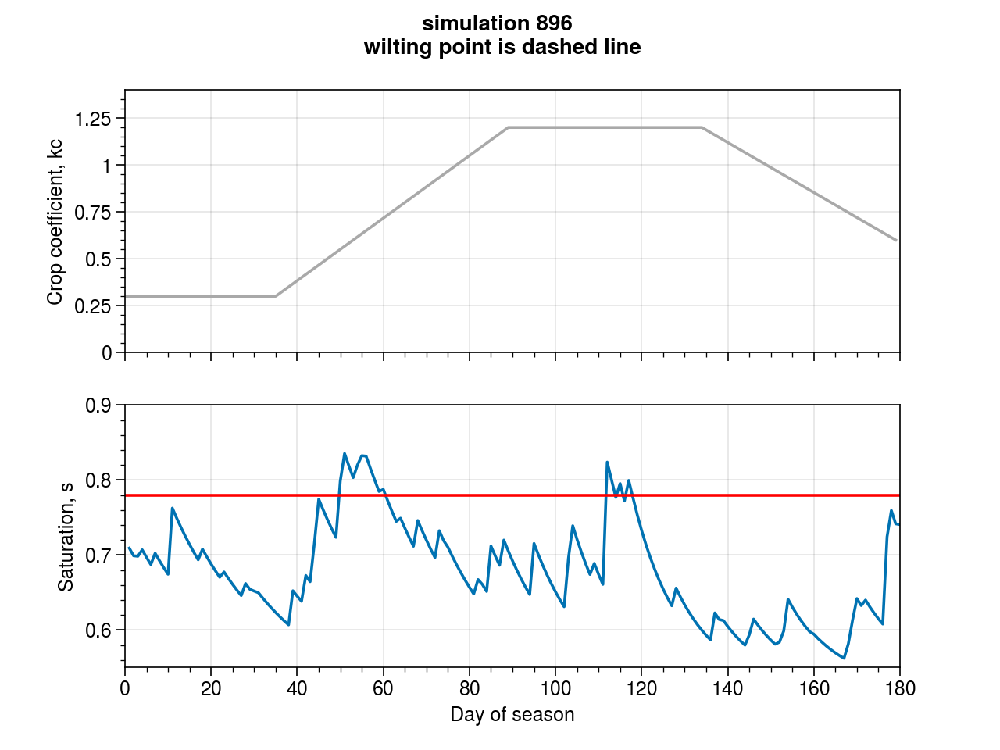

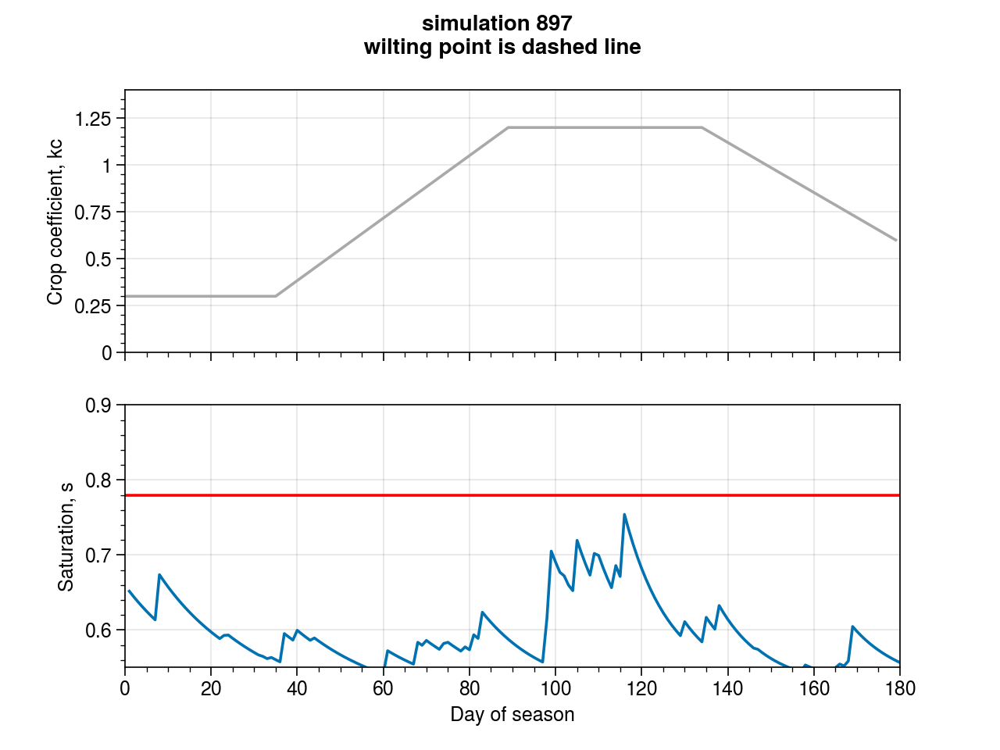

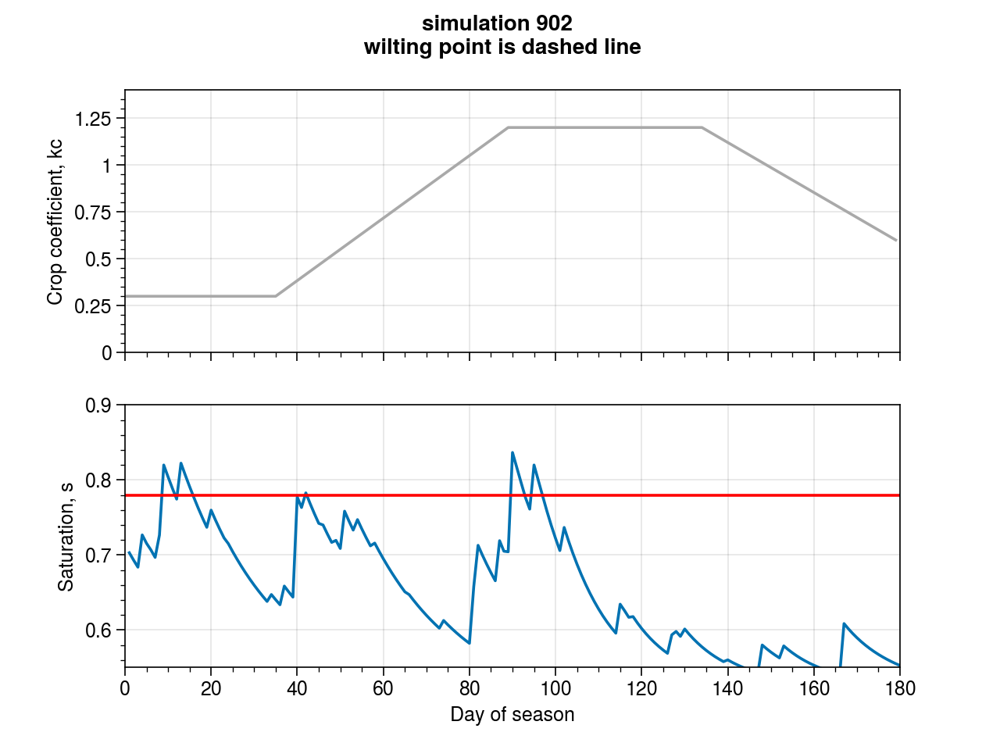

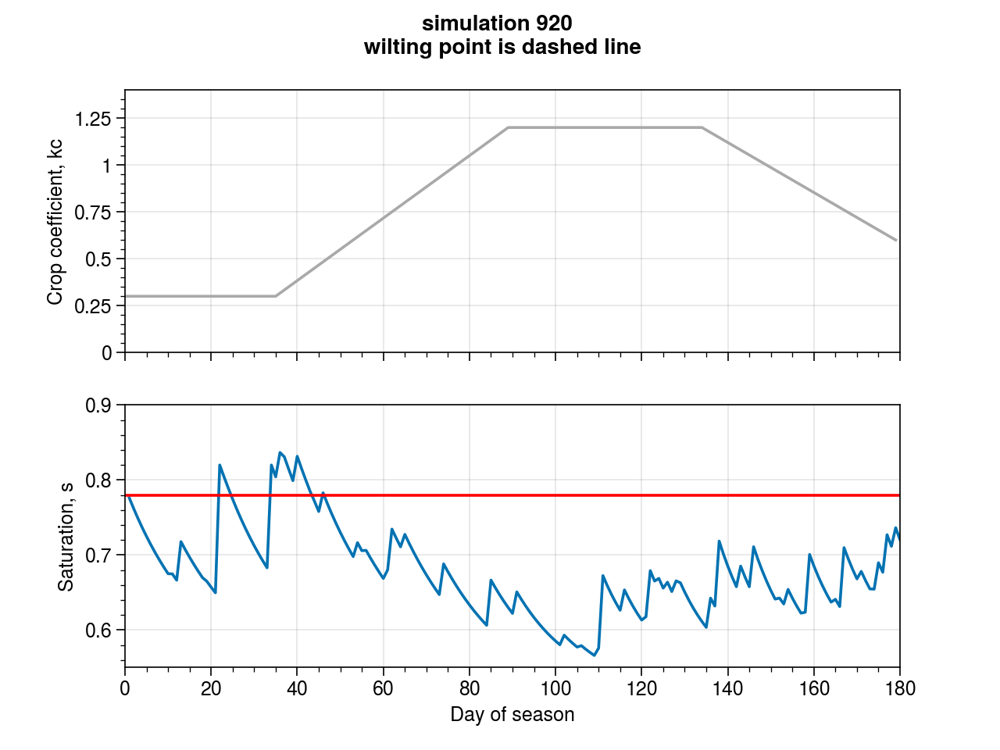

In [58]:
for i in bimod_sat.columns:
    
    fig, ax = plt.subplots(nrows=2, sharex = True) #constrained_layout=True
    bimod_sat[i].plot() # color='blue'
    #plt.title('wilting point is dashed line')
    plt.ylabel('Saturation, s')
    plt.xlabel('Day of season')
    plt.axhline(y=crop.s_star, color='r', linestyle='-')
    plt.axhline(y=crop.sw, color='r', linestyle='--')
    ax[1].set_ylim([0.55, 0.9])
    
    #secondary axis was too messy so adding secondary plot
    fig.suptitle('simulation %d \n wilting point is dashed line'%i)
    ax[0].plot(kc, color='darkgray') # , marker='o'
    ax[0].set_ylim([0, 1.4]) #xlim=(0, 0.4), 
    ax[0].set_ylabel('Crop coefficient, kc') # r'p($\bar{s}$)'
    
    # TODO: Would be good to annotate this plot with the total yield from the season
    #plt.savefig(str(i)+'_saturation.png')

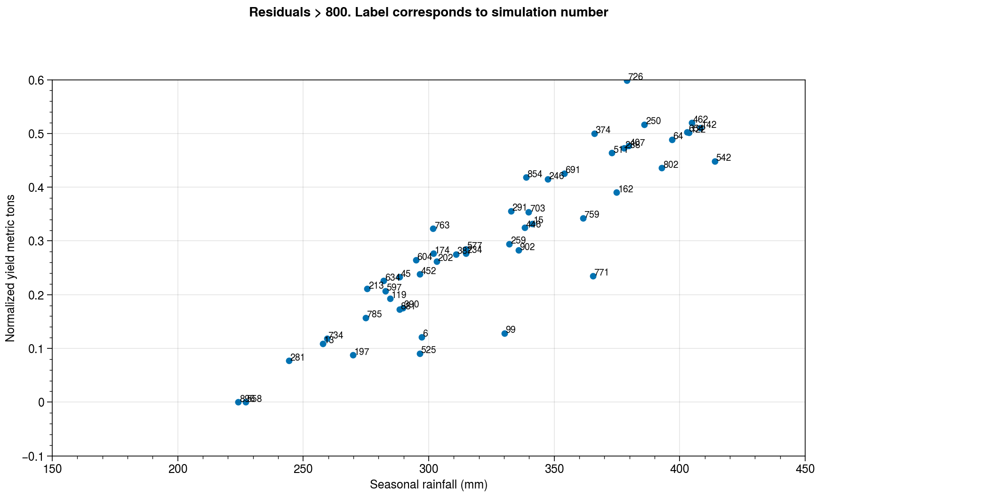

In [59]:
# Plot these points

len(x[x.index.isin(bimod.index)])

xdat=x[x.index.isin(bimod.index)]
ydat=y[y.index.isin(bimod.index)]

ydat_max_yield = ydat/max(df.Yield)

fig, ax = plot.subplots(axwidth=8, aspect=2) #width=6
ax.scatter(x[x.index.isin(bimod.index)], ydat_max_yield, lw=2) # color='blue'
ax.format(suptitle='Residuals > 800. Label corresponds to simulation number', xlabel='Seasonal rainfall (mm)', ylabel='Normalized yield metric tons')
ax.format(ylim=(-0.1, 0.6))
ax.format(xlim=(150, 450))

# need to run the columns below first
enumerate(colnames)
colnames

for i in colnames:
    ax.annotate(i, (xdat[i]+0.45, ydat_max_yield[i]+0.001), fontsize=7)

In [60]:
# these are the indixes of the bimodal simulations
good = bimod.index
df1 = df[df.index.isin(good)]
df2 = df[~df.index.isin(good)]

print(len(df))
print(len(df1))
print(len(df2))

1000
55
945


Text(0.5, 0, 'Rainfall (mm)')

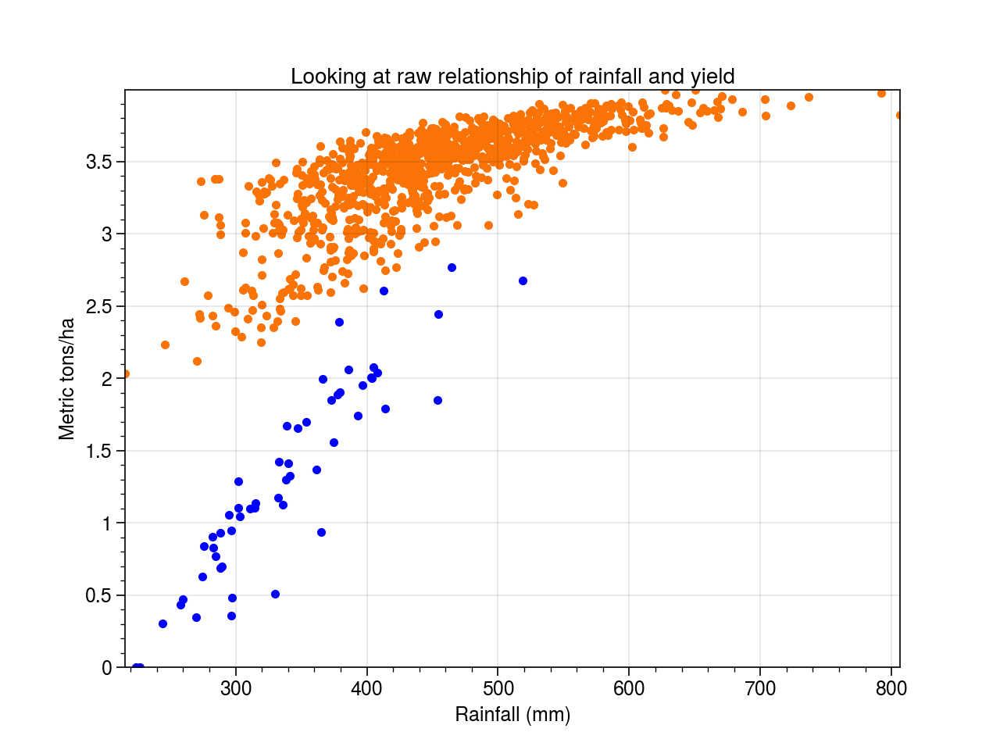

In [61]:
# Plot all the points with these residual simulations highlighted

plt.scatter(df1.RF, df1.Yield/1000, color='blue')
plt.scatter(df2.RF, df2.Yield/1000, color='orange')
#plt.ylim(-.10,1.10)
#plt.xlim(100,900)
plt.title('Looking at raw relationship of rainfall and yield')
plt.ylabel('Metric tons/ha')
plt.xlabel('Rainfall (mm)')

## What are the initial values of s when the model starts?

Maybe the crop is not consistently stressed for all of the model runs

count    55.000000
mean      0.635016
std       0.035153
min       0.574275
25%       0.604827
50%       0.637062
75%       0.654769
max       0.734510
Name: 0, dtype: float64
count    945.000000
mean       0.694332
std        0.065373
min        0.563182
25%        0.642726
50%        0.688805
75%        0.743922
max        0.866011
Name: 0, dtype: float64


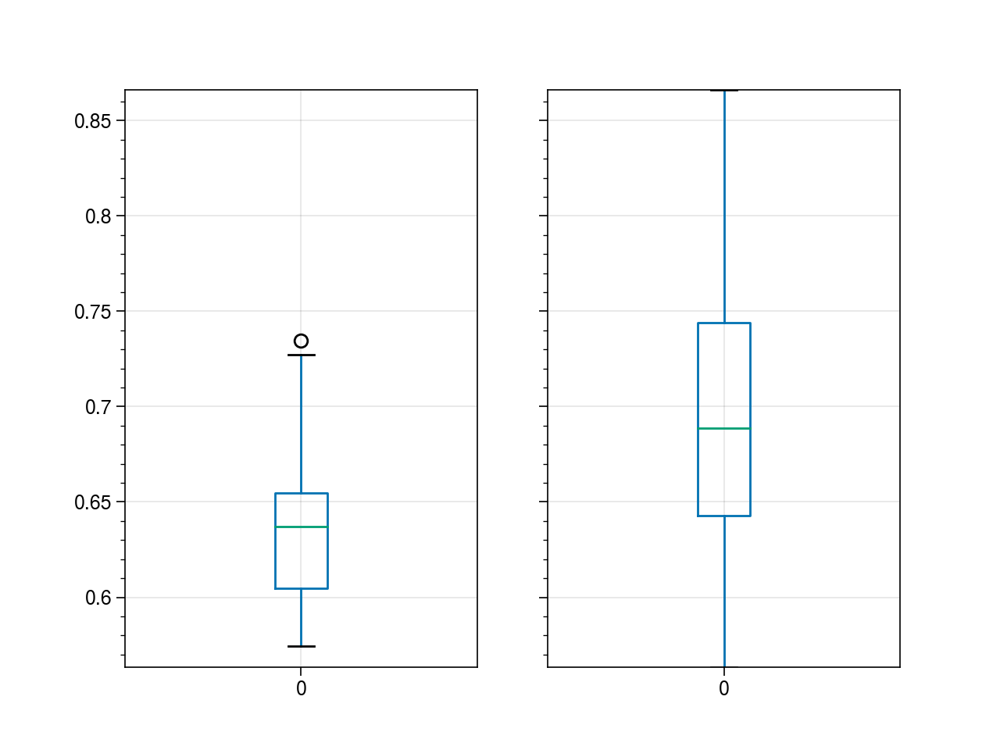

In [62]:
s0 = pd.DataFrame(list(zip(*sat))[0]).reset_index()

# check out some summary statistics
s0[0].describe()

# now subdivide by two categories
df1 = s0[s0.index.isin(good)]
df2 = s0[~s0.index.isin(good)]

# summary stats again
print(df1[0].describe())
print(df2[0].describe())

# this is maybe a little more promising
fig, ax = plt.subplots(nrows=1, ncols=2, sharey=True)
df1[0].plot.box(ax=ax[0]) 
df2[0].plot.box(ax=ax[1]) 

count    55.000000
mean      0.355740
std       0.155146
min       0.033109
25%       0.251008
50%       0.326901
75%       0.490968
max       0.677164
Name: 0, dtype: float64
count    945.000000
mean       0.183819
std        0.182334
min        0.000000
25%        0.020826
50%        0.133063
75%        0.301505
max        0.752158
Name: 0, dtype: float64


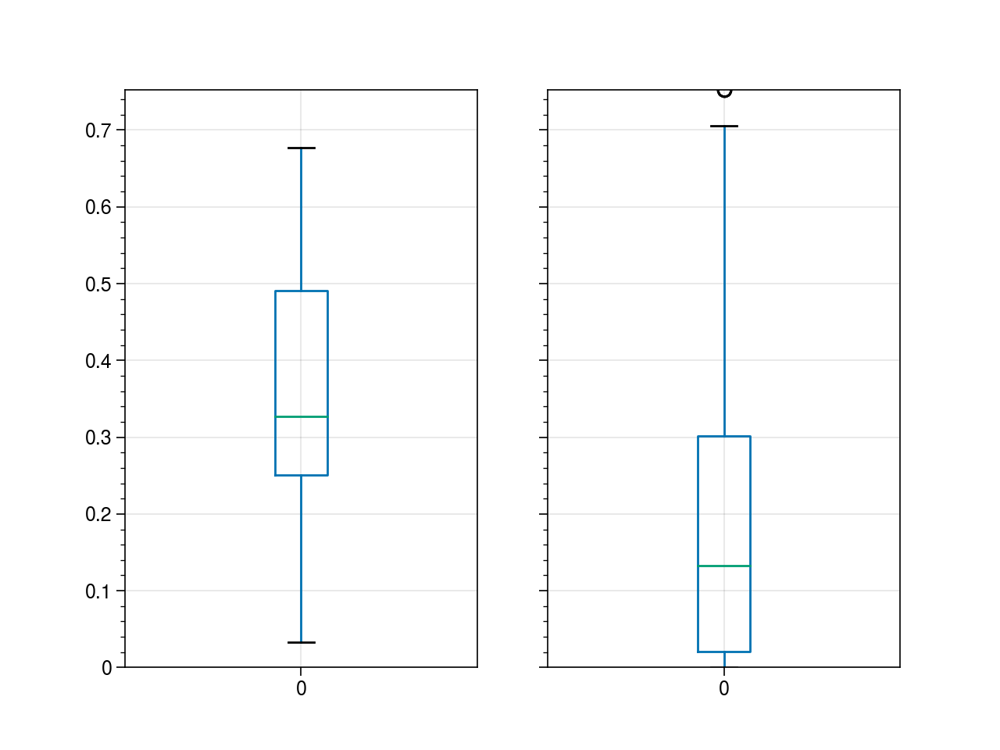

In [63]:
st0 = pd.DataFrame(list(zip(*stress))[0]).reset_index()

# check out some summary statistics
st0[0].describe()

# now subdivide by two categories
df1 = st0[st0.index.isin(good)]
df2 = st0[~st0.index.isin(good)]

# summary stats again
print(df1[0].describe())
print(df2[0].describe())

# not a clear difference here
fig, ax = plt.subplots(nrows=1, ncols=2, sharey=True)
df1[0].plot.box(ax=ax[0]) 
df2[0].plot.box(ax=ax[1]) 

### Prognosis so far...

Jacked up simulations to 10,000 and resulted in image below. This was using the residuals below -570 or so. Basically used the histogram to find a split and then took those simulations to plot in yellow. 
- I think it has to do with different lines or trajectories that we need to figure out what it's related to..
- There's something about these simulations and it doesn't have to do with whether a simulation crosses s_star, because as we saw before some of the simulations that dn't cross s-star still result in higher yields.
- There are distinct trajectory lines, which is confirmed in this plot of static stress against dynamic stress

In terms of the initial values of s0..
- There are differences in s0 between trajectories. 
- Do we want to standardize this by cranking up the number of days before the model starts
- Or use some other planting metric like stress is below 0.9 or something

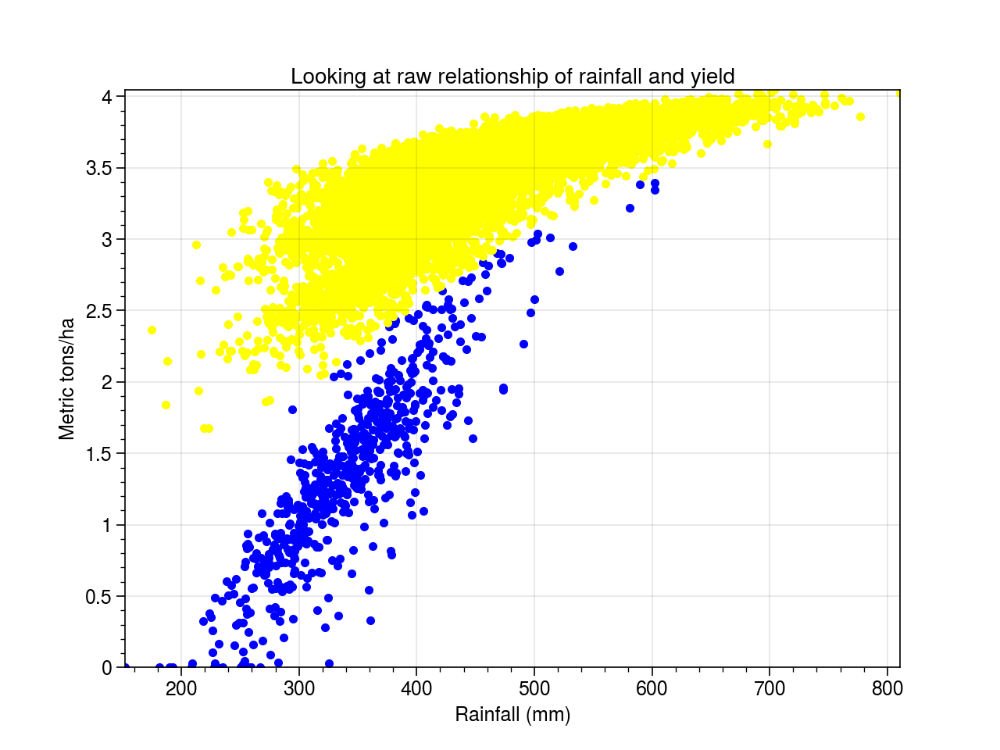

Text(0.5, 0, 'Static stress')

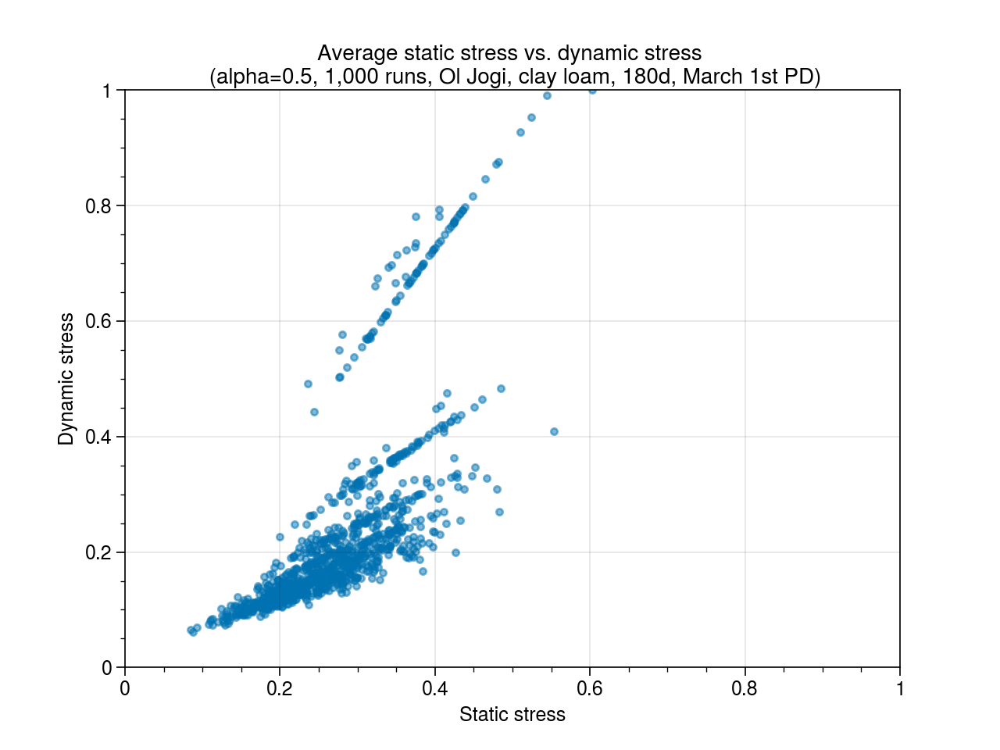

In [18]:
plt.scatter(df.AvgStress2, df.DynamicStress, alpha=0.5)
plt.ylim(0,1)
plt.xlim(0,1)
plt.title('Average static stress vs. dynamic stress \n (alpha=0.5, 1,000 runs, Ol Jogi, clay loam, 180d, March 1st PD)')
plt.ylabel('Dynamic stress')
plt.xlabel('Static stress')

## Summary statistics of the yellow and blue simulations

Aha. In the blue points, we see that the dynamic stress behaves as a normal distribution. Is there something happening in the dynamic stress of the orange points that's causing them to behave in a nonlinear-ish fashion?

In the equation for dynamic water stress its either the n_star or r that is causing it to go linear.

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fc038c905e0>,
      dtype=object)

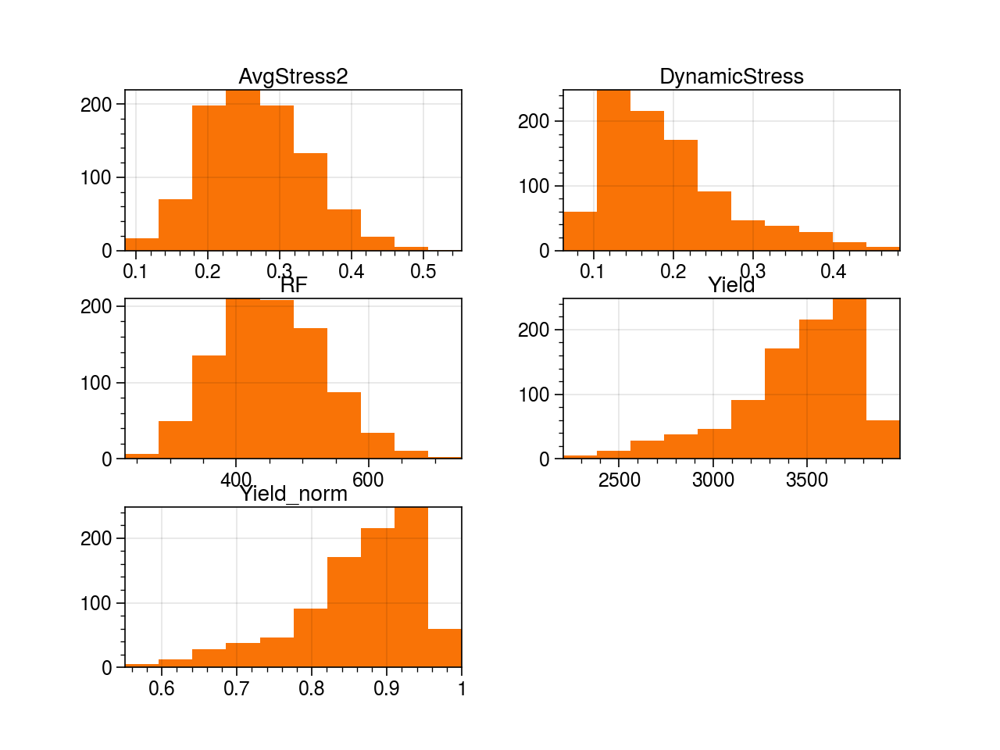

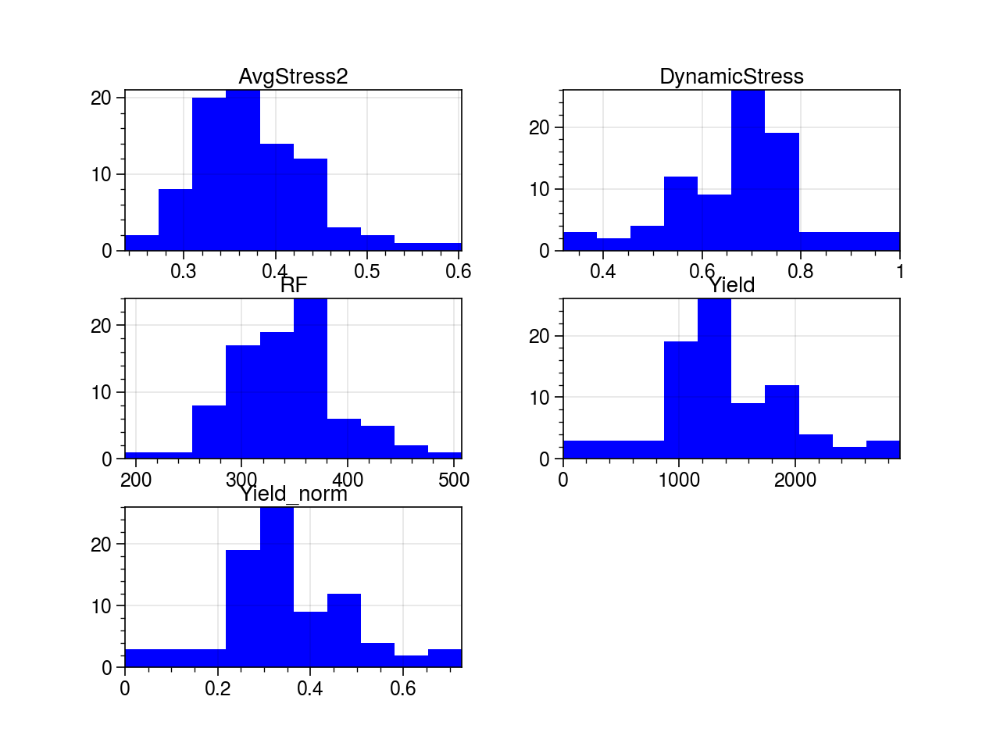

In [19]:
df2.hist(color='orange')
df1.hist(color='blue')

## Possible re-exploration of n_star and r in dynamic stress <a id='nr'></a>


### Are the second group of simulations related to time series that have values below wilting point? Or some other metric of excursions below wilting point or proximity to wilting point

In [20]:
# Test space
# For any simulation, we can see whether there is a value of s less than or equal to sw
i = 4
if len(output[i][output[i].s <= crop.sw]) > 0:
    print('True')


# This tells us where in the time series s crosses sw
indx_memb = np.where(output[i].s <= crop.sw)
indx_memb # in this case never

# This is a dataframe of those occurrences
output[i][output[i].s <= crop.sw]

,kc,LAI,stress,R,s,E,ET,T,L,dsdt,dos,doy


In [21]:
# Get all of the simulations that cross sw

s_min = []
n_sim = 1000
no_sims = np.arange(0,n_sim)

# figure out index number for simulation
for i in no_sims:
    #print(output[i][start:end]['s'].min())
    #_s_min = output[i][start:end]['s'].min()
    #_s_min = output[i][output[i].s >= crop.s_star]
    
    # What this does is if the length of the dataframe is greater than 0 then it prints the 
    # simulation number which means that it has a crossing
    if len(output[i][start:end][output[i].s <= crop.sw]) > 0:
        s_min.append(i)
    #s_min.append(_s_min)
    
result = pd.DataFrame({'sim_no':s_min}).sim_no.tolist()

<ipython-input-21-998de0a9eb23>:15: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if len(output[i][start:end][output[i].s <= crop.sw]) > 0:


1000
84
916


Text(0.5, 0, 'Rainfall (mm)')

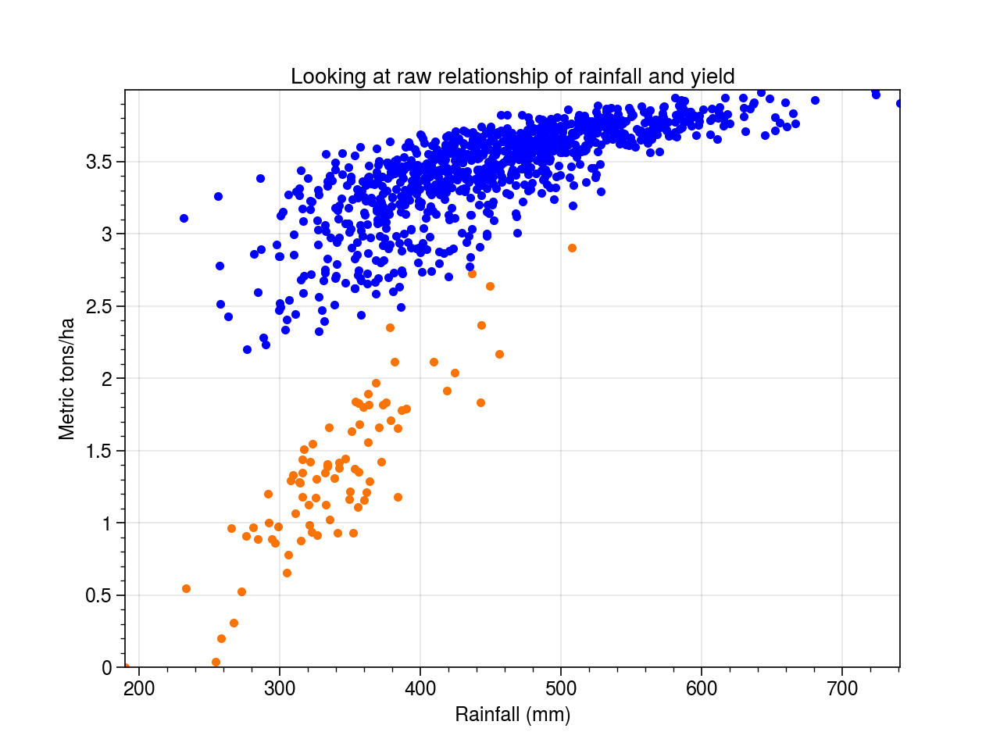

In [22]:
# Put all those indices together and change the color of the scatterplot

# How many simulations do cross sw
len(good)

# this is not the smartest way of doing this, but I need two dataframes one with the sims that cross star and the other one that doesnt
#result['flag'] = result.loc[result.index.isin(good)]
#result
df1 = df[df.index.isin(good)]
df2 = df[~df.index.isin(good)]

print(len(df))
print(len(df1))
print(len(df2))

# scatter plot of raw data
max(df.Yield)

#df1['Yield_norm'] = df.Yield/max(df.Yield)
#df1['Yield_norm'] = df1.Yield/max(df1.Yield)

plt.scatter(df1.RF, df1.Yield/1000, color='orange')
plt.scatter(df2.RF, df2.Yield/1000, color='blue')
#plt.ylim(-.10,1.10)
#plt.xlim(100,900)
plt.title('Looking at raw relationship of rainfall and yield')
plt.ylabel('Metric tons/ha')
plt.xlabel('Rainfall (mm)')

Oh, wow. So very clearly these are just related to the instances that cross wilting point. Makes sense. 
This explains why you can have really low yields for a 450 mm rainfall event say. It all falls along one trajectory.

Questions for Kelly:

1. Are these acceptable products of model assumptions that we can talk about in the real world?
2. Question to myself: Do I have anectodotal evidence about some really bad seasons vs. fine ones. Either in my notes or through the household survey. 

## So we know that n-star affects this second trajectory. Is there something that we're changing in `r` that is making this better or worse?

## Now try a for-loop where we have outputs for say five values of r...

In [23]:
# We can change the values of r using this function
def _calc_dstress(s, stress, K_PAR = 0.55, R_PAR=0.2, Y_MAX=4260): # got rid of self
        '''Calculates dyamic water stress (theta) which is a measure of total water stress during the growing season
        as proposed in Porporato et al. (2001). Considers the duration and frequency of water defict periods below a 
        critical value. The function also calculates yield based on dynamic water stress and returns three items in a
        list: average static water stress, dynamic water stress, and yield in kg per ha. 
        
        Usage: calc_dstress(s, stress):

            s = relative saturation [0-1]
            stress = static stress [0-1]

        Default values:
            mstr_memb = average static stress [0-1]
            mcrs_memb = average duration of water stress [days]
            ncrs_memb = average frequency of water stress [dim]
            self.lgp = length of the growing season [days]
            K_PAR = fraction of growing season before crop fails [dim]
            R_PAR = effect of number of excursions below stress point [dim]
            INVL_SIMU = number of daily timesteps used in calculating the soil moisture time series [dim]

        Returns:
            mstr_memb = np.mean(((self.s_star - s)/(self.s_star - self.sw))**q) # average static water stress
            dstr_memb = (mstr_memb * mcrs_memb) / (K_PAR * self.lgp))**(ncrs_memb**-R_PAR) # dynamic water stress
            yield_kg_ha = Y_MAX * (1 - dstr_memb) # yield in kg per ha
        
        '''
        # REMOVED SELF FROM THIS FUNCTION
        
        # Step 0. Define variables
        K_PAR = K_PAR
        R_PAR = R_PAR 
        INVL_SIMU = 1
        # added this
        lgp = 180
        # Step 1. Calculate average static stress
        if len(stress) > 0:
            # Subset the growing period and get avg soil moisture
            start = 21 
            end = start + lgp
            stress_subset = stress[start:end]
            mstr_memb = np.mean(stress_subset)
        else:
            mstr_memb = 0.

        # Step 2. Calculate threshold crossing parameters
        # Select indices of s time series where s is below wilting point
        indx_memb = np.where(s >= crop.s_star) 
        # Append to an array using np.append where last value is lgp+1 and INVL_SIMU is how many simulations are being run
        # Then have zero be the first item and 
        # with np.diff give the difference to find the soil moisture difference between s_star and the excursion
        ccrs_memb = np.diff(np.append(0, np.append(indx_memb, INVL_SIMU * lgp + 1))) - 1 # play around with this to figure it out 
        # The duration of water stress events where there is stress because value is greater than 0
        ccrs_memb = ccrs_memb[ccrs_memb > 0]
        # Variable with number of excursions below wilting point (frequency)
        ncrs_memb = len(ccrs_memb)  # dim 
        if ncrs_memb > 0:
            # if there are more than 0 excursions then calculate mean of duration of water stress and divide by INVL_SIMU
            mcrs_memb = np.mean(ccrs_memb) / INVL_SIMU # days
        else:
            mcrs_memb = 0.
            
        # Step 3. Calculate dynamic stress
        dstr_memb = ((mstr_memb * mcrs_memb) / (K_PAR * lgp))**(ncrs_memb**-R_PAR)
        if dstr_memb > 1.:
            dstr_memb = 1.

        # Step 4. Calculate yield
        yield_kg_ha = Y_MAX * (1 - dstr_memb)

        return mstr_memb, dstr_memb, yield_kg_ha

In [24]:
# Then we call on calc_dstress with this function

def dyn_stress(n_sim = 1000, station = 'OL JOGI FARM', texture = 'clay loam', lgp=180, pd_sim=60): 
    """ Run simulations for a specific climate, soil, and crop.

    Usage: total_rf_corr(n_sim, pd_ic, station, texture, lgp, pd_sim)
           
    Default values:
        n_sim = 500 # Number of Simulations to Remove Initial Conditions [integer]
        pd_ic = 1 # Planting Date for Initial Conditions [Julian day]
        station = 'OL JOGI FARM' # Climatology [string]
        texture = 'clay' # Soil Type [string]
        lgp = 180 # Length of Growing Period [Days]
        pd_sim 100 # Planting Date for Simulation [Julian day]

    """
    # Part 1. Set conditions for IC runs
    n_sim = n_sim # change back to 1000 later
    planting_date = pd_sim 

    # Part 2. Initialize model with a climate, soil and crop
    climate = Climate(station=station)
    soil = Soil(texture=texture)
    crop = Crop(soil=soil, lgp=lgp)
    soil.set_nZr(crop)

    model = CropModel(crop=crop, climate=climate, soil=soil)
    model.run()
    o = model.output()

    # Part 3. Get the mean, SD soil moisture and run the simulations to remove IC
    s0_mean, s0_std = average_soil_moisture(model, n_sims=n_sim, doy=planting_date)
    models = [CropModel(crop=crop, climate=Climate(), soil=soil) for i in np.arange(n_sim)]
    
    # Part 4. Run the actual simulations
    output = [model.run(s0=s0_mean, do_output=True, planting_date=planting_date) for model in models]
    # added this
    lgp = 180
    # Part 5. Subset the growing period and get avg stress, total rf
    start = 21 
    end = start + lgp
    avg_stress = [df[start:end]['stress'].mean() for df in output]
    total_stress = [df[start:end]['stress'].sum() for df in output]

    # dont need this but helpful for debugging
    total_rf = [df[start:end]['R'].sum() for df in output]
    avg_s = [df[start:end]['s'].mean() for df in output]
    sat = [df[start:end]['s'] for df in output]
    stress = [df[start:end]['stress'] for df in output]
    
    o = output
    
    # New thing: Try different values of r parameter
    result = []
    rs = [0.05, 0.2, 0.4, 0.6, 0.8, 1.1]

    for i in rs:
        # Part 6. Output the dynamic stress and yield values
        # prev crop.calc_dstress
        x = [_calc_dstress(s=df.s, stress=df.stress, R_PAR=i) for df in o] #for i in np.arange(n_sim)
        data_tuples = list(zip(x))
        df = pd.DataFrame(data_tuples, columns=['x']) # 
        result.append(df)
        df['R_PAR'] = i
        df['TotalRF'] = total_rf

    result = pd.concat(result)
    df = result
    # Need to seperate the tuples
    df[['AvgStress', 'DynamicStress','Yield']] = pd.DataFrame(df['x'].tolist(), index=df.index) 
    r_test = df[['R_PAR','AvgStress','DynamicStress','Yield','TotalRF']]
    
    # Part 7. TODO: Define kc, a little janky and needs to be automated
    start = 21
    end = 21 + 180
    kc = o[1][start:end]['kc'].tolist()
    print('done')
    return  total_rf, r_test, rs #output, avg_stress, total_stress, total_rf, mstr_memb, dstr_memb, yield_kg_ha
    # x, total_rf, sat, stress, o, crop, output, kc, start, end, 
    
# TODO: There's got to be a better way than to return all of these variables.
# But also maybe this is temporary for testing
total_rf, r_test, rs = dyn_stress()

# data, rf, sat, stress, o, crop, output, kc, start, end, result

done


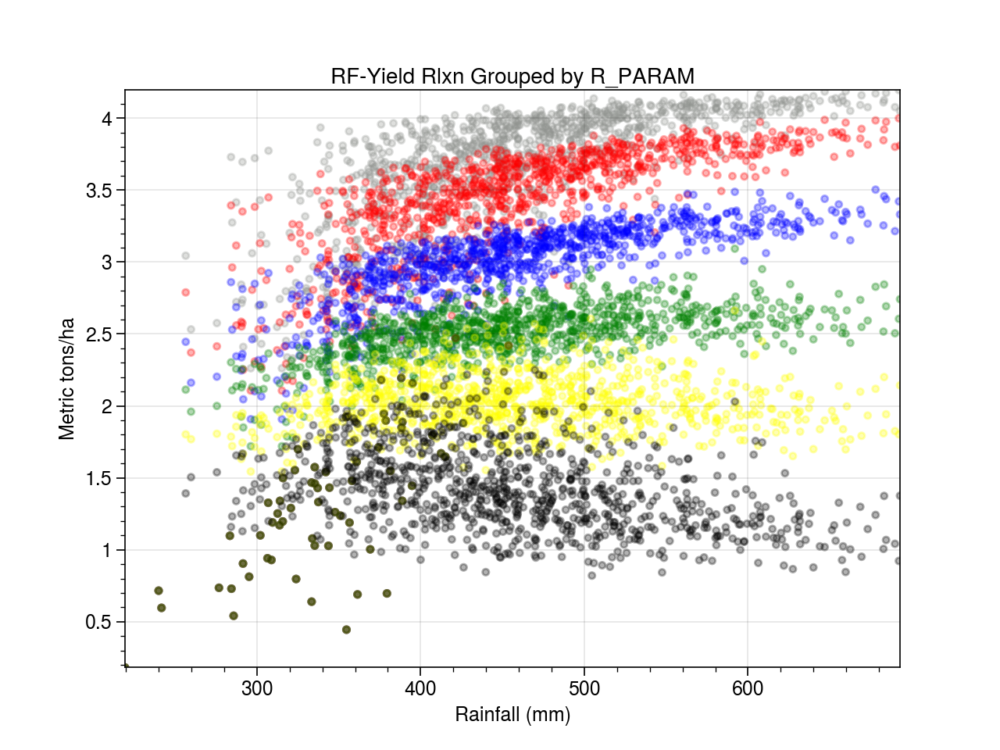

In [25]:
# got total rainfall onto that dataframe
# This might require some testing..?
r_test
len(total_rf)
r_test.AvgStress.nunique()
r_test.TotalRF.nunique()

# now want a figure of total rf vs yield where r parameters have different colors
r_test

fig, ax = plt.subplots()

colors = {0.05:'gray', 0.2:'red', 0.4:'blue', 0.6:'green', 0.8:'yellow', 1.1:'black'}

ax.scatter(r_test['TotalRF'], r_test['Yield']/1000, c=r_test['R_PAR'].apply(lambda x: colors[x]), alpha=0.3)
plt.title('RF-Yield Rlxn Grouped by R_PARAM')
plt.ylabel('Metric tons/ha')
plt.xlabel('Rainfall (mm)')
handles, labels = ax.get_legend_handles_labels()
#plt.legend(loc="upper left")

plt.show()

Text(0.06, 0.5, 'Yield (tons/ha)')

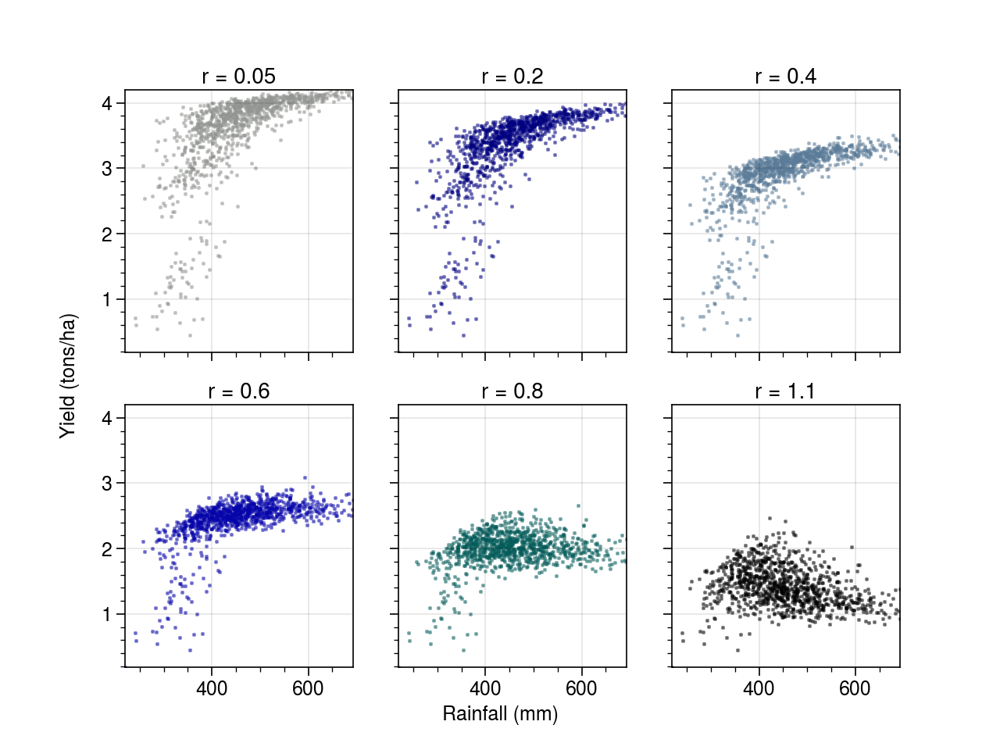

In [26]:
# Maybe I should make these different plots instead

fig, ax = plt.subplots(nrows = 2, ncols = 3, sharey=True, sharex=True)

#for i in rs:
#    select_color = r_test.loc[r_test['R_PAR'] == i]
#    select_color
   
select_color = r_test.loc[r_test['R_PAR'] == 0.05]
sc2 = r_test.loc[r_test['R_PAR'] == 0.2]
sc4 = r_test.loc[r_test['R_PAR'] == 0.4]
sc6 = r_test.loc[r_test['R_PAR'] == 0.6]
sc8 = r_test.loc[r_test['R_PAR'] == 0.8]
sc1 = r_test.loc[r_test['R_PAR'] == 1.1]

ax[0,0].scatter(select_color['TotalRF'], select_color['Yield']/1000,  s=0.4,marker='s', alpha=0.5,color='gray')
ax[0,1].scatter(sc2['TotalRF'], sc2['Yield']/1000, marker='s',  s=0.4,alpha=0.5, color="Navy")
ax[0,2].scatter(sc4['TotalRF'], sc4['Yield']/1000, marker='s',  s=0.4,alpha=0.5,color="Slate Blue")
ax[1,0].scatter(sc6['TotalRF'], sc6['Yield']/1000, marker='s',  s=0.4,alpha=0.5,color="Royal Blue")
ax[1,1].scatter(sc8['TotalRF'], sc8['Yield']/1000, marker='s', s=0.4, alpha=0.5,color="Dark Turquoise")
ax[1,2].scatter(sc1['TotalRF'], sc1['Yield']/1000, marker='s', s=0.4, alpha=0.5,color='black')

ax[0,0].set_title('r = 0.05')
ax[0,1].set_title('r = 0.2')
ax[0,2].set_title('r = 0.4')
ax[1,0].set_title('r = 0.6')
ax[1,1].set_title('r = 0.8')
ax[1,2].set_title('r = 1.1')

#for ax in ax.flat:
#    ax.set(xlabel='x-label', ylabel='y-label')

fig.text(0.5, 0.04, 'Rainfall (mm)', ha='center')
fig.text(0.06, 0.5, 'Yield (tons/ha)', va='center', rotation='vertical')
# gah I quit on making this complicated


Conclusions so far: Different values of r parameter still result in disjunctness until you get to r parameter above 1. 
There still seems to be a gap, which is interesting. And those lines. The lines are perhaps a little less evidence for r parameter of 0.6, so perhaps go with that. 0.6 also makes sense if the max yields of smallholders are closer to 2 t/ha.

For next thing to try see comment below.

- This is going to be really hammer headed but what are the values of n_star for the blue points versus the yellow points?

- Need to import dynamic stress function to test this out 

### What about k parameter's effect?

In [27]:
# New function to test values of k 

# Then we call on calc_dstress with this function

def dyn_stress(n_sim = 1000, station = 'OL JOGI FARM', texture = 'clay loam', lgp=180, pd_sim=60): 
    """ Run simulations for a specific climate, soil, and crop.

    Usage: total_rf_corr(n_sim, pd_ic, station, texture, lgp, pd_sim)
           
    Default values:
        n_sim = 500 # Number of Simulations to Remove Initial Conditions [integer]
        pd_ic = 1 # Planting Date for Initial Conditions [Julian day]
        station = 'OL JOGI FARM' # Climatology [string]
        texture = 'clay' # Soil Type [string]
        lgp = 180 # Length of Growing Period [Days]
        pd_sim 100 # Planting Date for Simulation [Julian day]

    """
    # Part 1. Set conditions for IC runs
    n_sim = n_sim # change back to 1000 later
    planting_date = pd_sim 

    # Part 2. Initialize model with a climate, soil and crop
    climate = Climate(station=station)
    soil = Soil(texture=texture)
    crop = Crop(soil=soil, lgp=lgp)
    soil.set_nZr(crop)

    model = CropModel(crop=crop, climate=climate, soil=soil)
    model.run()
    o = model.output()

    # Part 3. Get the mean, SD soil moisture and run the simulations to remove IC
    s0_mean, s0_std = average_soil_moisture(model, n_sims=n_sim, doy=planting_date)
    models = [CropModel(crop=crop, climate=Climate(), soil=soil) for i in np.arange(n_sim)]
    
    # Part 4. Run the actual simulations
    output = [model.run(s0=s0_mean, do_output=True, planting_date=planting_date) for model in models]
    # added this
    lgp = 180
    # Part 5. Subset the growing period and get avg stress, total rf
    start = 21 
    end = start + lgp
    avg_stress = [df[start:end]['stress'].mean() for df in output]
    total_stress = [df[start:end]['stress'].sum() for df in output]

    # dont need this but helpful for debugging
    total_rf = [df[start:end]['R'].sum() for df in output]
    avg_s = [df[start:end]['s'].mean() for df in output]
    sat = [df[start:end]['s'] for df in output]
    stress = [df[start:end]['stress'] for df in output]
    
    o = output
    
    # New thing: Try different values of r parameter
    result = []
    ks = [0.05, 0.2, 0.4, 0.6, 0.8, 0.95]

    for i in ks:
        # Part 6. Output the dynamic stress and yield values
        # prev crop.calc_dstress
        x = [_calc_dstress(s=df.s, stress=df.stress, K_PAR=i, R_PAR=0.2) for df in o] #for i in np.arange(n_sim)
        data_tuples = list(zip(x))
        df = pd.DataFrame(data_tuples, columns=['x']) # 
        result.append(df)
        df['K_PAR'] = i
        df['TotalRF'] = total_rf

    result = pd.concat(result)
    df = result
    # Need to seperate the tuples
    df[['AvgStress', 'DynamicStress','Yield']] = pd.DataFrame(df['x'].tolist(), index=df.index) 
    k_test = df[['K_PAR','AvgStress','DynamicStress','Yield','TotalRF']]
    
    # Part 7. TODO: Define kc, a little janky and needs to be automated
    start = 21
    end = 21 + 180
    kc = o[1][start:end]['kc'].tolist()
    print('done')
    return  total_rf, k_test, rs #output, avg_stress, total_stress, total_rf, mstr_memb, dstr_memb, yield_kg_ha
    # x, total_rf, sat, stress, o, crop, output, kc, start, end, 
    
total_rf, k_test, rs = dyn_stress()



done


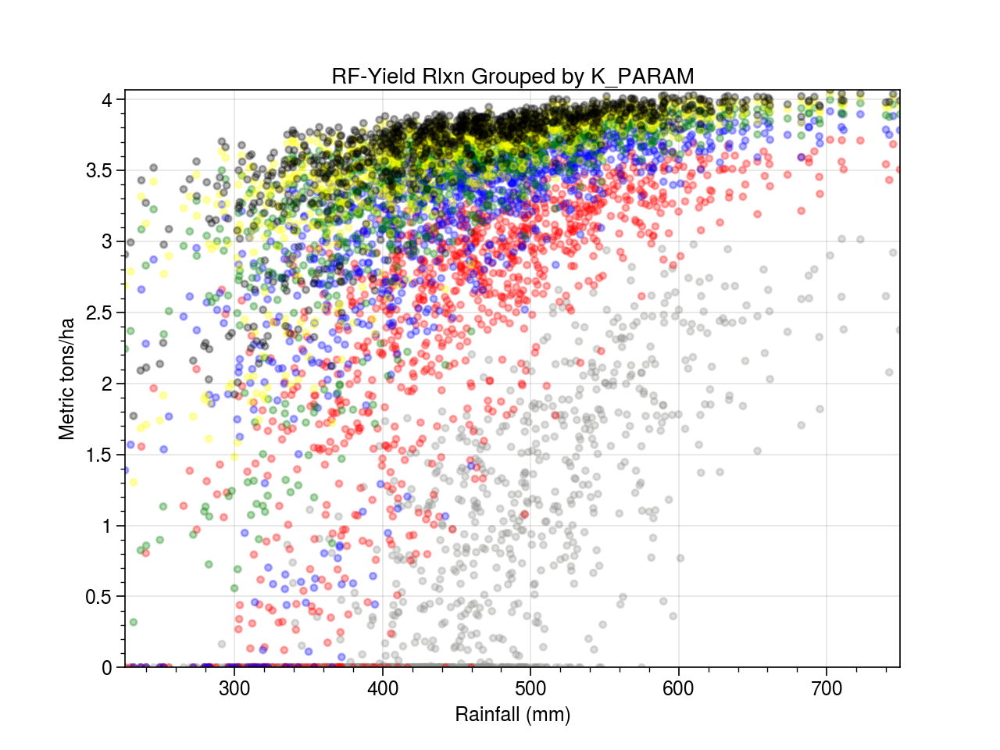

In [28]:
# Figure of k params
fig, ax = plt.subplots()

colors = {0.05:'gray', 0.2:'red', 0.4:'blue', 0.6:'green', 0.8:'yellow', 0.95:'black'}

ax.scatter(k_test['TotalRF'], k_test['Yield']/1000, c=k_test['K_PAR'].apply(lambda x: colors[x]), alpha=0.3)
plt.title('RF-Yield Rlxn Grouped by K_PARAM')
plt.ylabel('Metric tons/ha')
plt.xlabel('Rainfall (mm)')
handles, labels = ax.get_legend_handles_labels()
#plt.legend(loc="upper left")

plt.show()

Text(0.06, 0.5, 'Yield (tons/ha)')

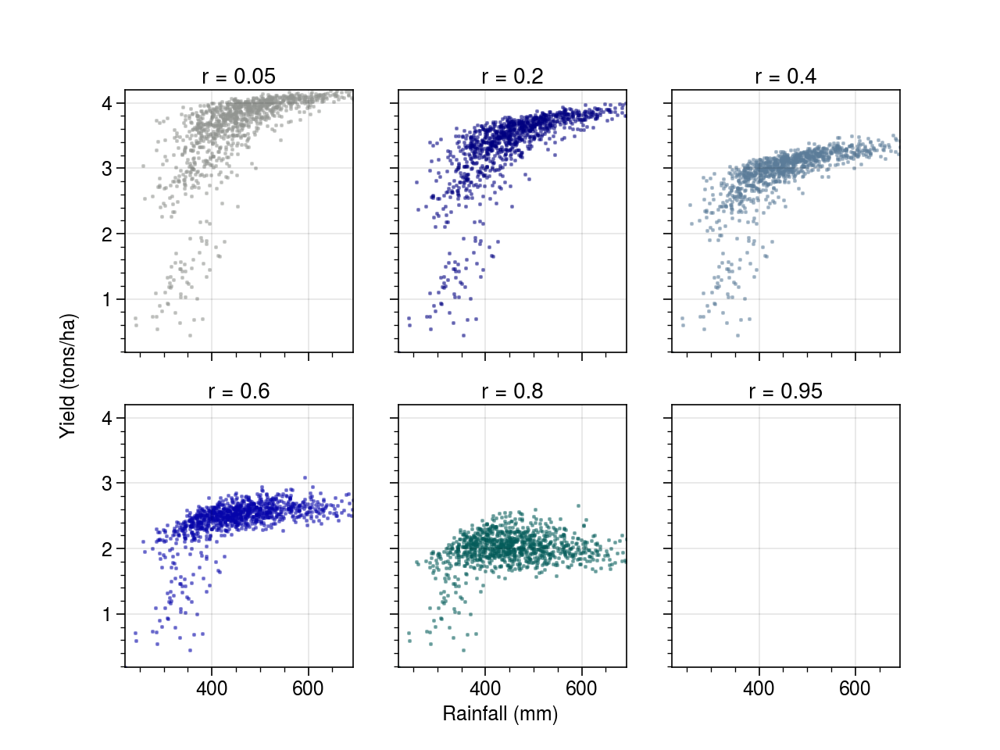

In [29]:
# Maybe I should make these different plots instead

fig, ax = plt.subplots(nrows = 2, ncols = 3, sharey=True, sharex=True)

#for i in rs:
#    select_color = r_test.loc[r_test['R_PAR'] == i]
#    select_color
   
select_color = r_test.loc[r_test['R_PAR'] == 0.05]
sc2 = r_test.loc[r_test['R_PAR'] == 0.2]
sc4 = r_test.loc[r_test['R_PAR'] == 0.4]
sc6 = r_test.loc[r_test['R_PAR'] == 0.6]
sc8 = r_test.loc[r_test['R_PAR'] == 0.8]
sc1 = r_test.loc[r_test['R_PAR'] == 0.95]

ax[0,0].scatter(select_color['TotalRF'], select_color['Yield']/1000,  s=0.4,marker='s', alpha=0.5,color='gray')
ax[0,1].scatter(sc2['TotalRF'], sc2['Yield']/1000, marker='s',  s=0.4,alpha=0.5, color="Navy")
ax[0,2].scatter(sc4['TotalRF'], sc4['Yield']/1000, marker='s',  s=0.4,alpha=0.5,color="Slate Blue")
ax[1,0].scatter(sc6['TotalRF'], sc6['Yield']/1000, marker='s',  s=0.4,alpha=0.5,color="Royal Blue")
ax[1,1].scatter(sc8['TotalRF'], sc8['Yield']/1000, marker='s', s=0.4, alpha=0.5,color="Dark Turquoise")
ax[1,2].scatter(sc1['TotalRF'], sc1['Yield']/1000, marker='s', s=0.4, alpha=0.5,color='black')

ax[0,0].set_title('r = 0.05')
ax[0,1].set_title('r = 0.2')
ax[0,2].set_title('r = 0.4')
ax[1,0].set_title('r = 0.6')
ax[1,1].set_title('r = 0.8')
ax[1,2].set_title('r = 0.95')

#for ax in ax.flat:
#    ax.set(xlabel='x-label', ylabel='y-label')

fig.text(0.5, 0.04, 'Rainfall (mm)', ha='center')
fig.text(0.06, 0.5, 'Yield (tons/ha)', va='center', rotation='vertical')
# gah I quit on making this complicated


- Thoughts: Change k or r doesn't seem to affect whether the bifurcation is there. So we can continue with the story that it has to do with dips below wilting point.
- From an agronomic or smallholder perspective, what causes these dips below wilting point?

## I'll come back to this in a little bit

This tells me it's maybe not just crossing s star but some threshold above or nearby s_star? 

## Old figures

Text(0.5, 1.0, 'Histograms of Rainfall (blue) and Yield (orange)')

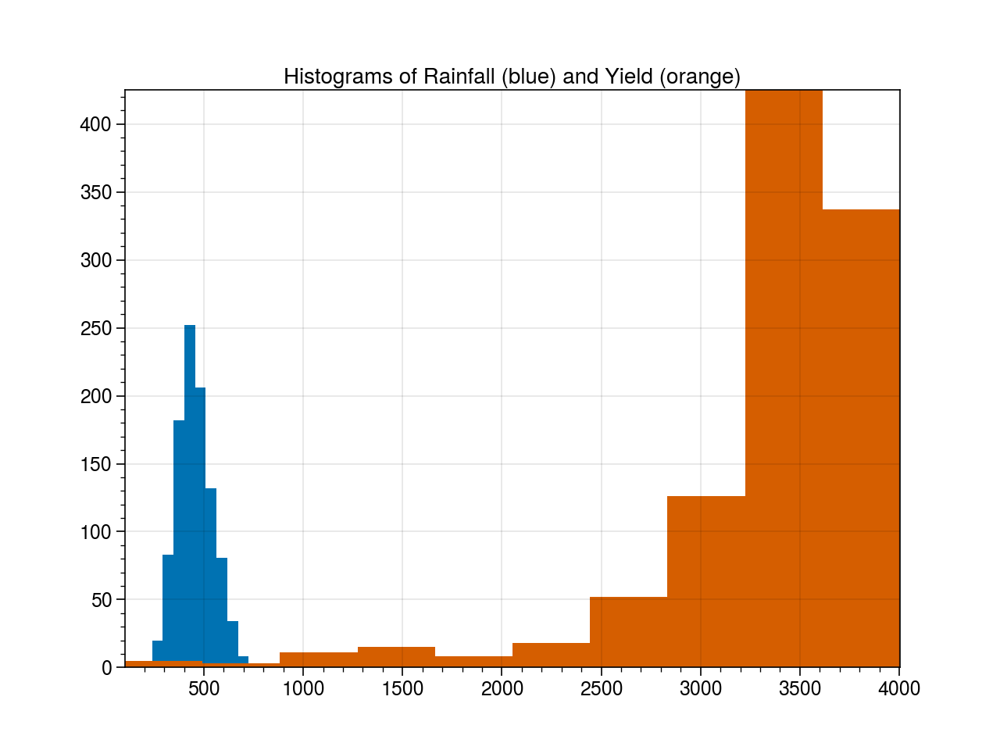

In [24]:
# distributions of yield and rainfall
df.RF.hist()
df.Yield.hist()
plt.title('Histograms of Rainfall (blue) and Yield (orange)')


In [ ]:
# To add annotations to the yellows, use this. Warning it gets a little messy
enumerate(df1.index)
df1.index

xdat = df1.RF
ydat = df1.Yield/1000

for i in df1.index:
    plt.annotate(i, (xdat[i]+0.45, ydat[i]+0.001), fontsize=7)
